In [1]:
import pandas as pd
import numpy as np

In [ ]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d"/content/drive/MyDrive/Dog Vision/Data"

In [2]:
import tensorflow as tf
import tensorflow_hub as hub

print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)

print("GPU", "available (YESS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
Hub version: 0.16.1
GPU available (YESS!!!!)


In [ ]:
#mount drive
/#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Project_ML/Dog_Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


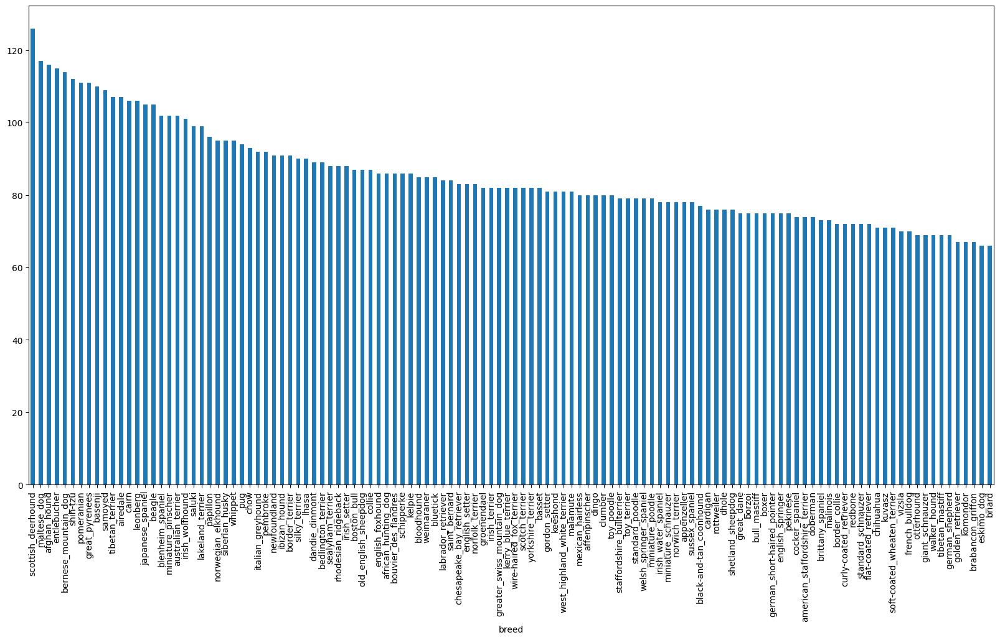

In [4]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [5]:
from IPython.display import display, Image

In [6]:
filenames = ["/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/" + fname + ".jpg" for fname in labels_csv["id"]]

In [7]:
filenames[:5]

['/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [8]:
import os
if len(os.listdir("/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train")) == len(filenames):
  print("Filenames match actual amount of files!")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!


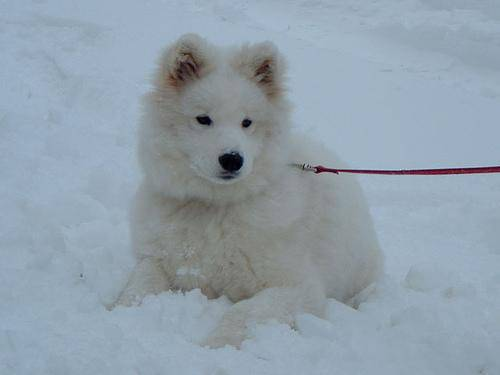

In [9]:
Image(filenames[70])

In [10]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
labels[:5]

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever'],
      dtype=object)

In [11]:
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


In [12]:
unique_breeds = np.unique(labels)
print(unique_breeds)
len(unique_breeds)


array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(labels[0])
print(np.where(unique_breeds == labels[0])[0][0])
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
X = filenames
y = boolean_labels

In [ ]:
NUM_IMAGES = 1000
NUM_IMAGES

1000

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:5]

(['/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
     

In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[402])
image.shape

(500, 333, 3)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 333, 3), dtype=uint8, numpy=
array([[[167, 129, 118],
        [167, 129, 118],
        [167, 129, 118],
        ...,
        [184, 150, 141],
        [184, 150, 141],
        [184, 150, 141]],

       [[167, 129, 118],
        [167, 129, 118],
        [167, 129, 118],
        ...,
        [184, 150, 141],
        [184, 150, 141],
        [184, 150, 141]]], dtype=uint8)>

In [ ]:
IMG_SIZE = 224

def process_image(image_path):

  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [ ]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

In [ ]:
BATCH_SIZE = 32

# function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):

  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                              tf.constant(y)))

    data = data.shuffle(buffer_size=len(x))

    data = data.map(get_image_label)

    # batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):

  plt.figure(figsize=(10, 10))

  for i in range(25):
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

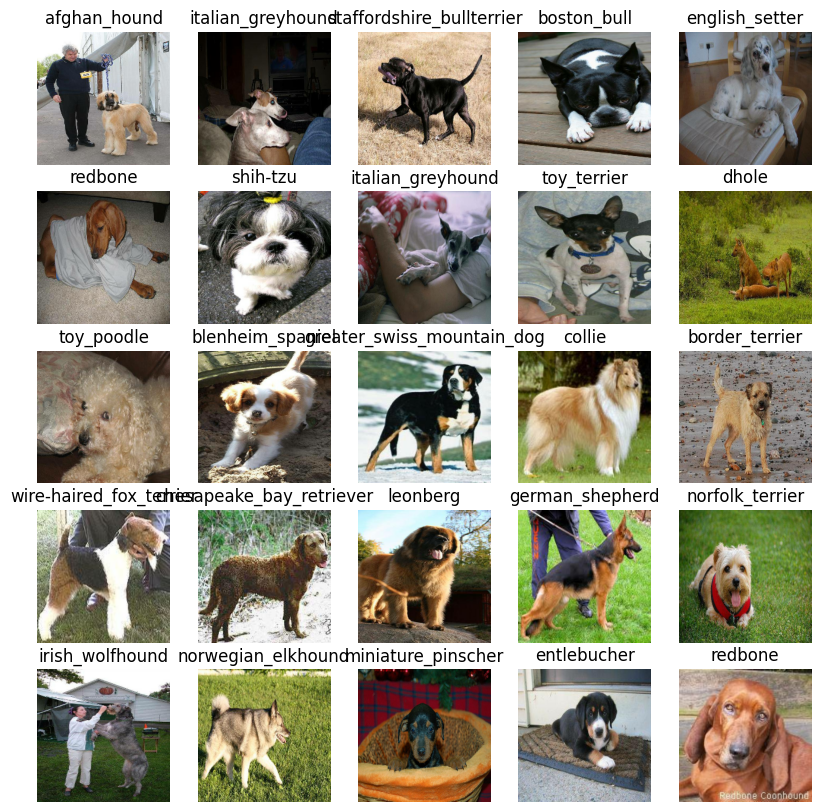

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

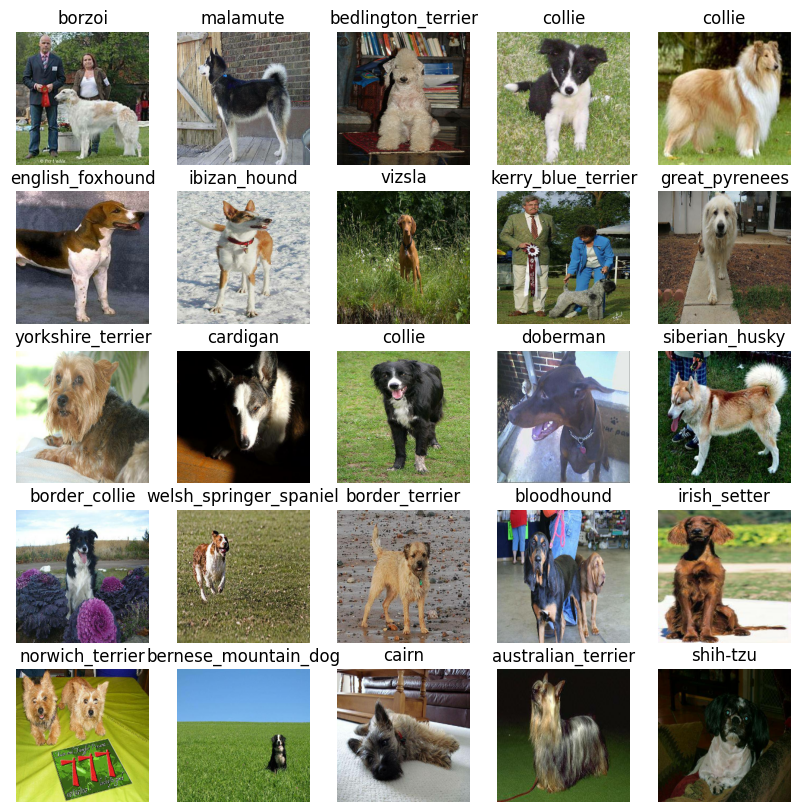

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

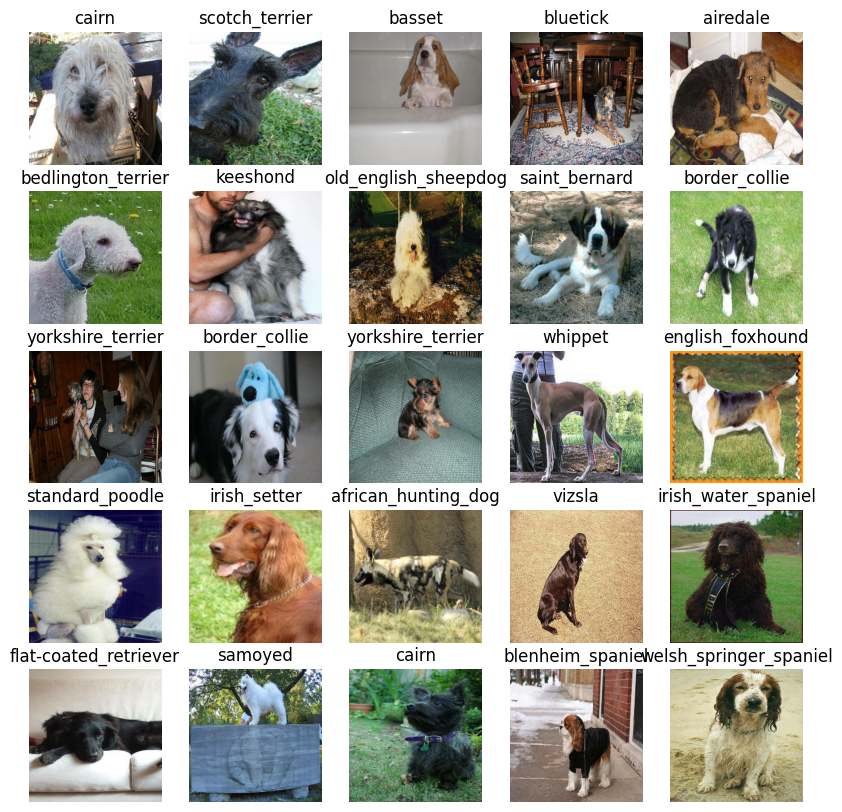

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE=len(unique_breeds)
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL),
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax")
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

In [ ]:
def create_tensorboard_callback():
    log_dir=os.path.join("/content/drive/MyDrive/Project_ML/Dog_Vision/Data/log_dir",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S" ))
    return tf.keras.callbacks.TensorBoard(log_dir)

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

In [ ]:
NUM_EPOCHS=100

In [ ]:
def train_model():
    model=create_model()
    tensorboard=create_tensorboard_callback()
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=val_data,
              validation_freq=1,
              batch_size=None,
              callbacks=[tensorboard,early_stopping])

    return model

In [ ]:
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 196s 8s/step - loss: 4.5262 - accuracy: 0.0913 - val_loss: 3.4385 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 4s 148ms/step - loss: 1.6194 - accuracy: 0.6725 - val_loss: 2.2037 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 6s 224ms/step - loss: 0.5585 - accuracy: 0.9413 - val_loss: 1.7134 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 4s 147ms/step - loss: 0.2488 - accuracy: 0.9862 - val_loss: 1.5296 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 148ms/step - loss: 0.1470 - accuracy: 0.9975 - val_loss: 1.4580 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 5s 202ms/step - loss: 0.1010 - accuracy: 0.9987 - val_loss: 1.4003 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

In [ ]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
!kill 13321

/bin/bash: line 1: kill: (13321) - No such process


In [ ]:

%tensorboard --logdir /content/drive/MyDrive/Project_ML/Dog_Vision/Data/log_dir

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 42s 128ms/step


array([[3.4207664e-04, 1.7438820e-04, 1.1416618e-03, ..., 4.4185697e-05,
        5.1019582e-05, 5.2243825e-03],
       [1.4043811e-03, 4.3406503e-04, 2.4148924e-02, ..., 6.6692638e-04,
        1.8198679e-03, 2.9763512e-04],
       [1.2652036e-05, 2.0077584e-04, 5.0410072e-05, ..., 3.7167169e-06,
        6.5482185e-05, 1.6983539e-04],
       ...,
       [4.9395279e-05, 4.6746182e-04, 5.4684695e-04, ..., 6.0917533e-05,
        6.8161619e-04, 3.8709710e-04],
       [2.2238421e-03, 1.1574865e-03, 1.6963764e-04, ..., 3.0833576e-04,
        5.9038281e-05, 4.3259017e-02],
       [4.0631072e-04, 4.0149778e-05, 6.4749102e-04, ..., 1.8179617e-03,
        7.4376154e-04, 4.8453113e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[1]

array([1.40438112e-03, 4.34065034e-04, 2.41489243e-02, 2.91519100e-03,
       6.35323231e-04, 8.30918798e-05, 3.31768673e-03, 1.36507011e-03,
       2.72855745e-03, 5.33916231e-04, 4.41159413e-04, 8.82544336e-05,
       1.11618123e-04, 2.54194092e-05, 1.85781901e-04, 5.66713104e-04,
       2.38693552e-03, 2.73425976e-04, 1.64874073e-04, 7.82837393e-04,
       1.90213002e-04, 7.29286476e-05, 5.22338560e-05, 2.59163004e-04,
       2.72174715e-04, 2.08572295e-04, 2.86004655e-02, 4.48234472e-03,
       9.50980575e-06, 4.96239343e-04, 1.37211478e-04, 2.96413127e-05,
       1.06546178e-03, 1.24592902e-04, 5.15152176e-04, 2.33267187e-04,
       1.64677956e-04, 7.42541393e-04, 2.29926067e-04, 3.74166375e-05,
       1.42044970e-04, 1.11209476e-04, 2.38543107e-05, 5.31892525e-04,
       1.07960147e-03, 1.21688854e-03, 1.02199358e-03, 1.03330363e-04,
       4.61541489e-02, 4.55762092e-05, 1.13144706e-04, 1.71059847e-03,
       5.68350915e-05, 6.28819689e-05, 4.22450900e-03, 5.90347825e-03,
      

In [ ]:
predictions[1].shape

(120,)

In [ ]:
def get_pred_label(prediction_probabilities):

    return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
pred_label = get_pred_label(predictions[8])
pred_label

'saint_bernard'

In [ ]:
def unbatchify(data):
  images = []
  labels = []
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)


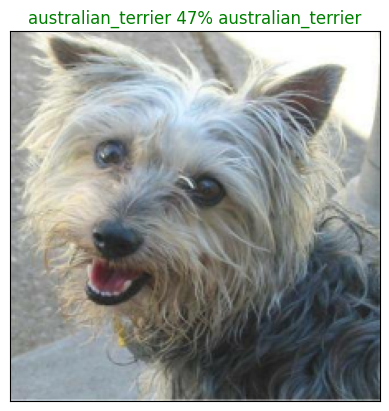

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=98)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  pred_label = get_pred_label(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass


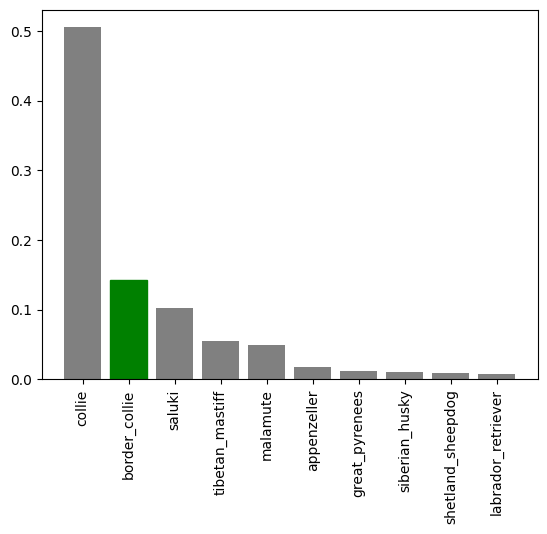

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

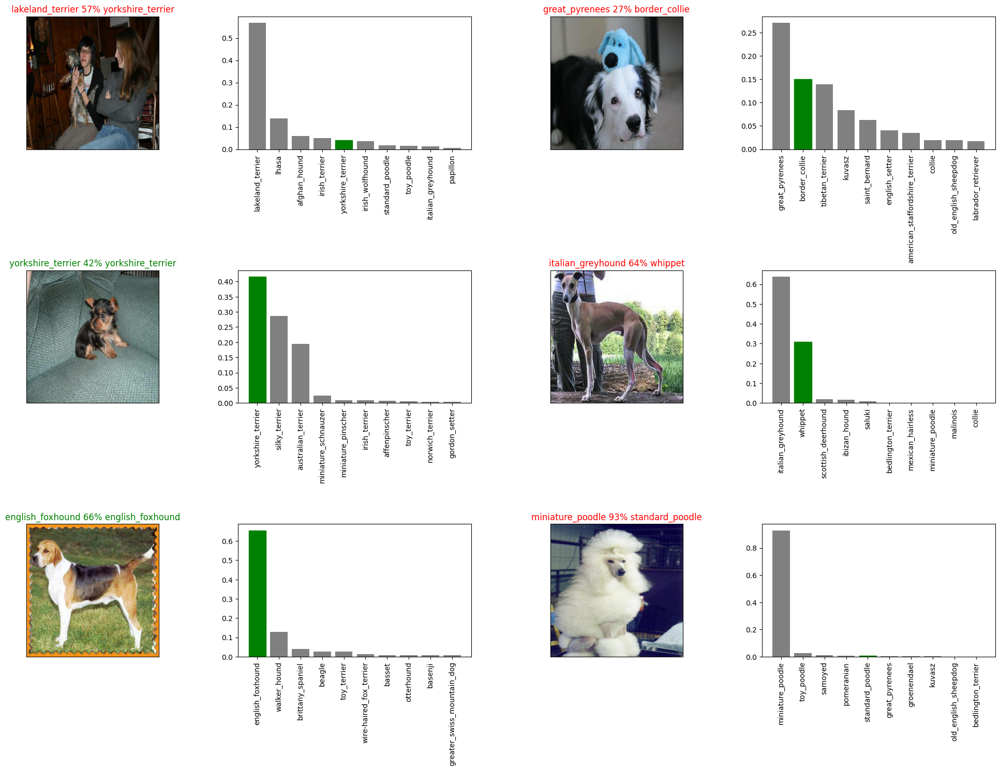

In [ ]:
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
def save_model(model, suffix=None):
  modeldir = os.path.join("/content/drive/MyDrive/Project_ML/Dog_Vision/Models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
def load_model(model_path):

  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images")

Saving model to: /content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08041717056280-1000-images.h5...


'/content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08041717056280-1000-images.h5'

In [ ]:
loaded_1000_image_model = load_model('/content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08041717056280-1000-images.h5')

Loading saved model from: /content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08041717056280-1000-images.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 103ms/step - loss: 1.3071 - accuracy: 0.6500


[1.3070855140686035, 0.6499999761581421]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 105ms/step - loss: 1.3071 - accuracy: 0.6500


[1.3070855140686035, 0.6499999761581421]

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
full_batch=create_data_batches(X,y)

Creating training data batches...


In [ ]:
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [ ]:
full_model.fit(x=full_batch,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1847s 6s/step - loss: 1.3329 - accuracy: 0.6681
Epoch 2/100
320/320 [==============================] - 44s 136ms/step - loss: 0.3979 - accuracy: 0.8817
Epoch 3/100
320/320 [==============================] - 42s 132ms/step - loss: 0.2352 - accuracy: 0.9336
Epoch 4/100
320/320 [==============================] - 46s 144ms/step - loss: 0.1537 - accuracy: 0.9633
Epoch 5/100
320/320 [==============================] - 44s 136ms/step - loss: 0.1037 - accuracy: 0.9808
Epoch 6/100
320/320 [==============================] - 42s 131ms/step - loss: 0.0781 - accuracy: 0.9857
Epoch 7/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0581 - accuracy: 0.9919
Epoch 8/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0458 - accuracy: 0.9936
Epoch 9/100
320/320 [==============================] - 46s 143ms/step - loss: 0.0378 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 43s 135ms

In [ ]:
save_model(full_model, suffix="full-image-set")

Saving model to: /content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08541717059251-full-image-set.h5...


'/content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08541717059251-full-image-set.h5'

In [ ]:
loaded_full_model = load_model('/content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08531717059208-full-image-set.h5')

Loading saved model from: /content/drive/MyDrive/Project_ML/Dog_Vision/Models/20240530-08531717059208-full-image-set.h5


In [ ]:
test_path = "/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e29d2336a8559d96973c874c9c6c17c6.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/df99a948e43d3399aff2e8ab2c18e184.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e59d59ffbb65d9eae166d4068af5d9b9.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e6ed62f411426a4f7e26e6ccdbaf7ecc.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e647098485898391b700270c61824282.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e061b8d24e7b1324a6ac92ae81fdda19.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e76a58909e6e1196bdefb3105060bcbe.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e145bbebb9ad1e740256e460899a6b67.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e2b24cea9d0796ffad73cb24eab1a3f6.jpg',
 '/content/drive/MyDrive/Project_ML/Dog_Vision/Data/test/e7129bc2dbbba99bedc87c7787cbdf1f.jpg']

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 56s 174ms/step


In [ ]:
np.savetxt("/content/drive/MyDrive/Project_ML/Dog_Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Project_ML/Dog_Vision/preds_array.csv", delimiter=",")

In [ ]:
pred = []
for i in range(len(test_predictions)):
  pred.append(get_pred_label(test_predictions[i]))
pred

['scotch_terrier',
 'lakeland_terrier',
 'french_bulldog',
 'boxer',
 'boston_bull',
 'malamute',
 'norwegian_elkhound',
 'sussex_spaniel',
 'whippet',
 'chihuahua',
 'old_english_sheepdog',
 'bull_mastiff',
 'scottish_deerhound',
 'basenji',
 'rottweiler',
 'sealyham_terrier',
 'scottish_deerhound',
 'boxer',
 'black-and-tan_coonhound',
 'rhodesian_ridgeback',
 'norfolk_terrier',
 'samoyed',
 'shih-tzu',
 'beagle',
 'redbone',
 'standard_schnauzer',
 'great_pyrenees',
 'irish_wolfhound',
 'irish_setter',
 'kerry_blue_terrier',
 'west_highland_white_terrier',
 'border_collie',
 'pug',
 'basset',
 'american_staffordshire_terrier',
 'borzoi',
 'great_pyrenees',
 'dandie_dinmont',
 'soft-coated_wheaten_terrier',
 'chow',
 'shih-tzu',
 'collie',
 'collie',
 'lhasa',
 'weimaraner',
 'sussex_spaniel',
 'sussex_spaniel',
 'welsh_springer_spaniel',
 'silky_terrier',
 'toy_poodle',
 'bedlington_terrier',
 'brabancon_griffon',
 'australian_terrier',
 'scottish_deerhound',
 'chihuahua',
 'staffor